# Fitbit Data Analysis

In [1]:
import numpy as np 
import pandas as pd 
from sklearn.model_selection import train_test_split
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
import seaborn as sns
import os
import pandas_profiling

## Data Loading

In [4]:
activitydf = pd.read_csv('FitBit data.csv.xls') # importing the dataset

In [5]:
activitydf 

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories
0,1503960366,3/25/2016,11004,7.110000,7.110000,0.0,2.57,0.46,4.07,0.00,33,12,205,804,1819
1,1503960366,3/26/2016,17609,11.550000,11.550000,0.0,6.92,0.73,3.91,0.00,89,17,274,588,2154
2,1503960366,3/27/2016,12736,8.530000,8.530000,0.0,4.66,0.16,3.71,0.00,56,5,268,605,1944
3,1503960366,3/28/2016,13231,8.930000,8.930000,0.0,3.19,0.79,4.95,0.00,39,20,224,1080,1932
4,1503960366,3/29/2016,12041,7.850000,7.850000,0.0,2.16,1.09,4.61,0.00,28,28,243,763,1886
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
452,8877689391,4/8/2016,23014,20.389999,20.389999,0.0,11.10,0.63,8.62,0.00,70,29,359,982,4196
453,8877689391,4/9/2016,16470,8.070000,8.070000,0.0,0.00,0.02,8.02,0.00,90,9,289,1052,3841
454,8877689391,4/10/2016,28497,27.530001,27.530001,0.0,21.92,1.12,4.46,0.00,128,46,211,1055,4526
455,8877689391,4/11/2016,10622,8.060000,8.060000,0.0,1.47,0.15,6.37,0.01,18,7,225,1190,2820


In [6]:
# seeing the full report about the dataset
activitydf.profile_report() 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Exploratory Data Analysis (EDA)

In [6]:
# checking the number of rows and columns in the dataset
activitydf.shape 

(457, 15)

In [7]:
# checking the number of missing values in the dataset
activitydf.isnull().sum() 

Id                          0
ActivityDate                0
TotalSteps                  0
TotalDistance               0
TrackerDistance             0
LoggedActivitiesDistance    0
VeryActiveDistance          0
ModeratelyActiveDistance    0
LightActiveDistance         0
SedentaryActiveDistance     0
VeryActiveMinutes           0
FairlyActiveMinutes         0
LightlyActiveMinutes        0
SedentaryMinutes            0
Calories                    0
dtype: int64

In [8]:
# copying the datset to activity1
activity1 = activitydf.copy() 

In [9]:
# checking out the unique activity dates in the dataset
activity1['ActivityDate'].unique()

array(['3/25/2016', '3/26/2016', '3/27/2016', '3/28/2016', '3/29/2016',
       '3/30/2016', '3/31/2016', '4/1/2016', '4/2/2016', '4/3/2016',
       '4/4/2016', '4/5/2016', '4/6/2016', '4/7/2016', '4/8/2016',
       '4/9/2016', '4/10/2016', '4/11/2016', '4/12/2016', '3/12/2016',
       '3/13/2016', '3/14/2016', '3/15/2016', '3/16/2016', '3/17/2016',
       '3/18/2016', '3/19/2016', '3/20/2016', '3/21/2016', '3/22/2016',
       '3/23/2016', '3/24/2016'], dtype=object)

In [10]:
 # cheking out the datset before transformation
activity1['ActivityDate'].head(10) 

0    3/25/2016
1    3/26/2016
2    3/27/2016
3    3/28/2016
4    3/29/2016
5    3/30/2016
6    3/31/2016
7     4/1/2016
8     4/2/2016
9     4/3/2016
Name: ActivityDate, dtype: object

In [11]:
# adding the yearm month and date columns to the dataset
activity1['year'] = pd.DatetimeIndex(activity1['ActivityDate']).year
activity1['month'] = pd.DatetimeIndex(activity1['ActivityDate']).month
activity1['date'] = pd.DatetimeIndex(activity1['ActivityDate']).day

In [12]:
# cheking out the datset after transformation
activity1.head(10)

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories,year,month,date
0,1503960366,3/25/2016,11004,7.11,7.11,0.0,2.57,0.46,4.07,0.0,33,12,205,804,1819,2016,3,25
1,1503960366,3/26/2016,17609,11.55,11.55,0.0,6.92,0.73,3.91,0.0,89,17,274,588,2154,2016,3,26
2,1503960366,3/27/2016,12736,8.53,8.53,0.0,4.66,0.16,3.71,0.0,56,5,268,605,1944,2016,3,27
3,1503960366,3/28/2016,13231,8.93,8.93,0.0,3.19,0.79,4.95,0.0,39,20,224,1080,1932,2016,3,28
4,1503960366,3/29/2016,12041,7.85,7.85,0.0,2.16,1.09,4.61,0.0,28,28,243,763,1886,2016,3,29
5,1503960366,3/30/2016,10970,7.16,7.16,0.0,2.36,0.51,4.29,0.0,30,13,223,1174,1820,2016,3,30
6,1503960366,3/31/2016,12256,7.86,7.86,0.0,2.29,0.49,5.04,0.0,33,12,239,820,1889,2016,3,31
7,1503960366,4/1/2016,12262,7.87,7.87,0.0,3.32,0.83,3.64,0.0,47,21,200,866,1868,2016,4,1
8,1503960366,4/2/2016,11248,7.25,7.25,0.0,3.00,0.45,3.74,0.0,40,11,244,636,1843,2016,4,2
9,1503960366,4/3/2016,10016,6.37,6.37,0.0,0.91,1.28,4.18,0.0,15,30,314,655,1850,2016,4,3


In [13]:
#dropping the TrackerDistance column
activity1=activity1.drop(['TrackerDistance'],axis=1) 

In [14]:
import datetime as dt

In [15]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Group the data by day of the month and calculate the calories burnt
grouped_data = activity1.groupby('date')['Calories'].sum().reset_index()

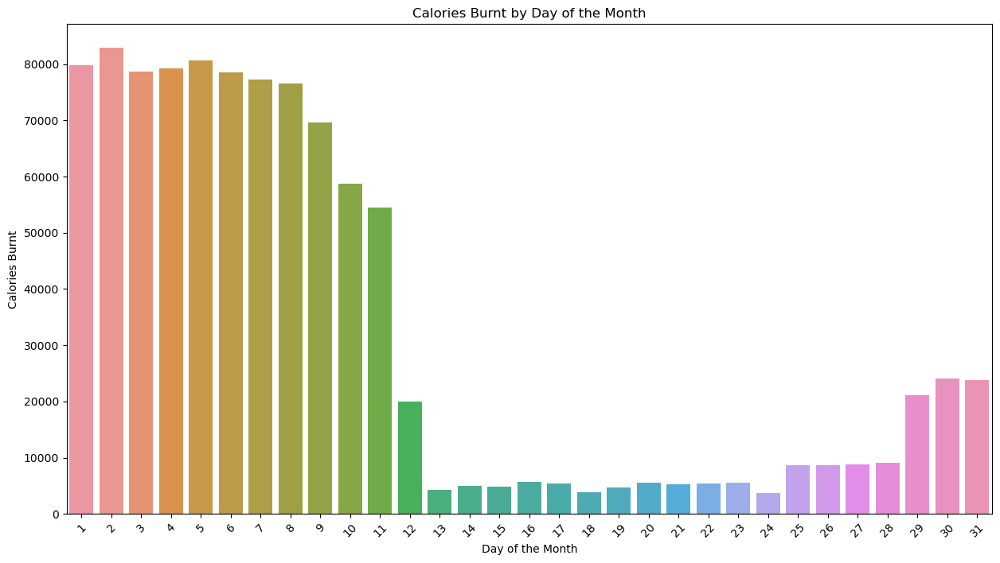

In [16]:
# Set the figure size
plt.figure(figsize=(15, 8))

# Create the bar graph
ax = sns.barplot(x='date', y='Calories', data=grouped_data)

# Set the title and labels
ax.set_title('Calories Burnt by Day of the Month')
ax.set_xlabel('Day of the Month')
ax.set_ylabel('Calories Burnt')

# Rotate the x-axis labels for better visibility if needed
plt.xticks(rotation=45)

# Display the plot
plt.show()


In [17]:
# converting the datatype to datetime
activity1['Week'] = pd.to_datetime(activity1.ActivityDate).dt.week
activity1['Year'] = pd.to_datetime(activity1.ActivityDate).dt.year

In [18]:
# cheking out the datset after transformation
activity1.head()  

,Id,ActivityDate,TotalSteps,TotalDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories,year,month,date,Week,Year
0,1503960366,3/25/2016,11004,7.11,0.0,2.57,0.46,4.07,0.0,33,12,205,804,1819,2016,3,25,12,2016
1,1503960366,3/26/2016,17609,11.55,0.0,6.92,0.73,3.91,0.0,89,17,274,588,2154,2016,3,26,12,2016
2,1503960366,3/27/2016,12736,8.53,0.0,4.66,0.16,3.71,0.0,56,5,268,605,1944,2016,3,27,12,2016
3,1503960366,3/28/2016,13231,8.93,0.0,3.19,0.79,4.95,0.0,39,20,224,1080,1932,2016,3,28,13,2016
4,1503960366,3/29/2016,12041,7.85,0.0,2.16,1.09,4.61,0.0,28,28,243,763,1886,2016,3,29,13,2016


In [19]:
# converting it to datetime
activity1['ActivityDate'] = pd.to_datetime(activity1['ActivityDate'])

# converting the day of the week to the name of the day
activity1['day'] = activity1['ActivityDate'].dt.day_name


Text(0.5, 1.0, 'Scatterplot of calories and intense_activities')

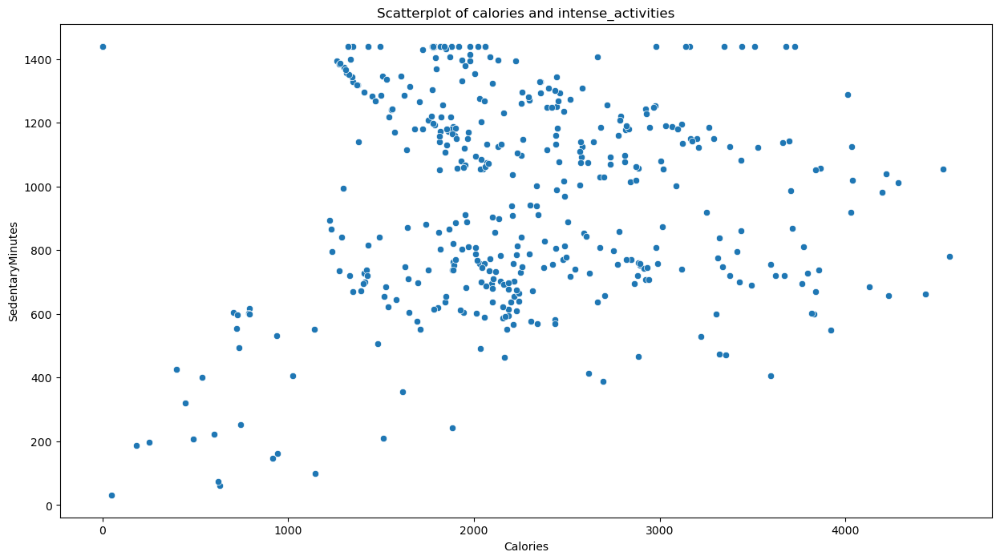

In [20]:
# figure size
plt.figure(figsize=(15,8))

# Simple scatterplot
ax = sns.scatterplot(x='Calories', y='SedentaryMinutes', data=activity1)

ax.set_title('Scatterplot of calories and intense_activities')

Text(0.5, 1.0, 'Scatterplot of calories and LightlyActiveMinutes')

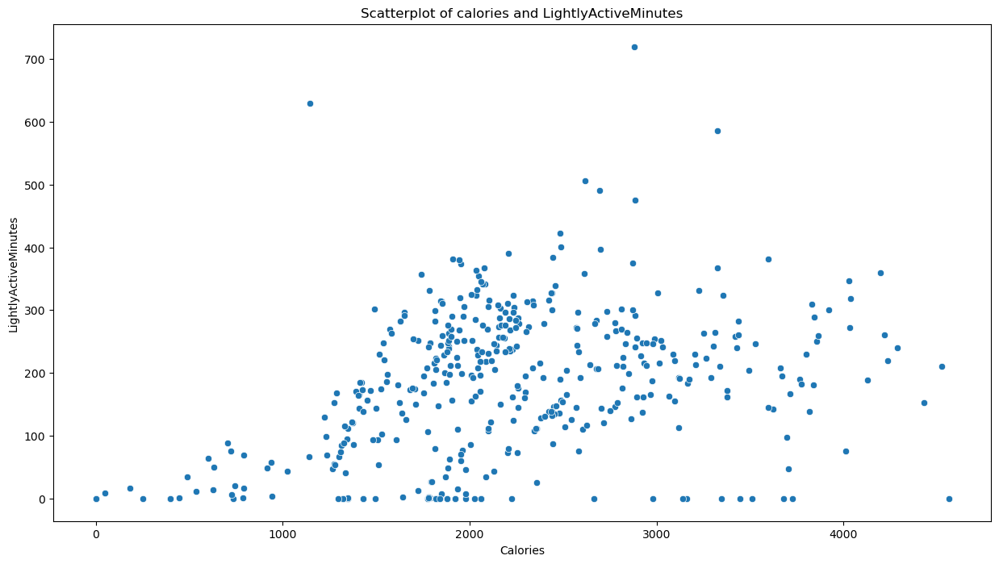

In [21]:
# figure size
plt.figure(figsize=(15,8))

# Simple scatterplot
ax = sns.scatterplot(x='Calories', y='LightlyActiveMinutes', data=activity1)

ax.set_title('Scatterplot of calories and LightlyActiveMinutes')

Text(0.5, 1.0, 'Scatterplot of calories vs Fairly Active Minutes')

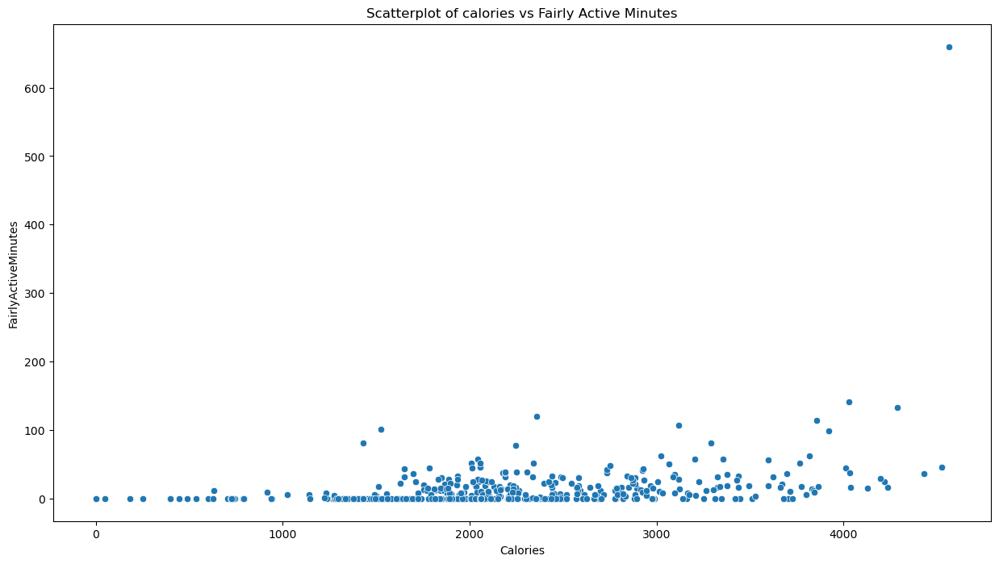

In [22]:
# figure size
plt.figure(figsize=(15,8))

# Simple scatterplot between calories burnt in the moderately active minutes
ax = sns.scatterplot(x='Calories', y='FairlyActiveMinutes', data=activity1)

ax.set_title('Scatterplot of calories vs Fairly Active Minutes')

Text(0.5, 1.0, 'Scatterplot of calories and intense_activities')

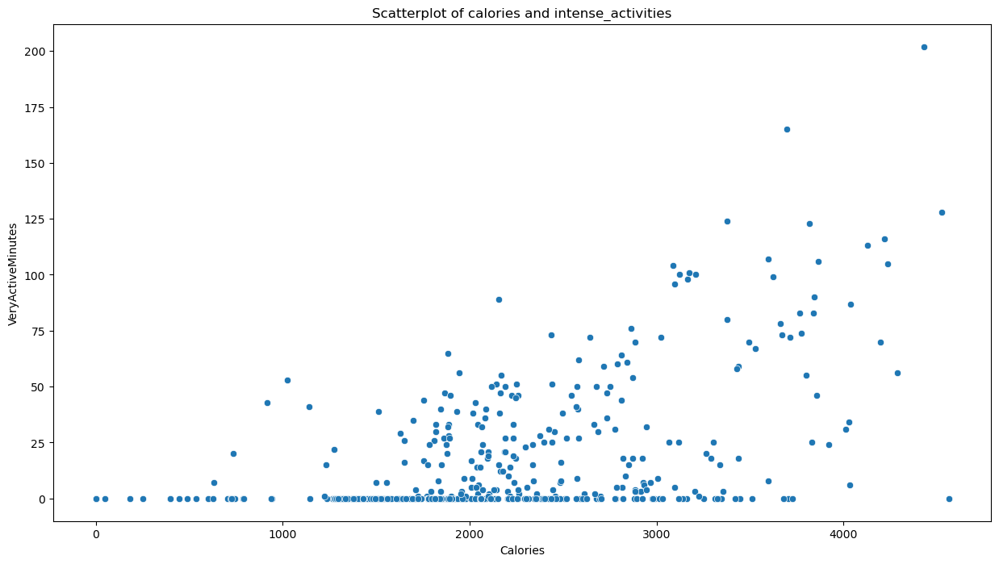

In [23]:
# figure size
plt.figure(figsize=(15,8))

# Simple scatterplot between calories burnt in the intensely active minutes
ax = sns.scatterplot(x='Calories', y='VeryActiveMinutes', data=activity1)

ax.set_title('Scatterplot of calories and intense_activities')

Text(0.5, 1.0, 'Un-normalized value of calories and different activities based on activity minutes')

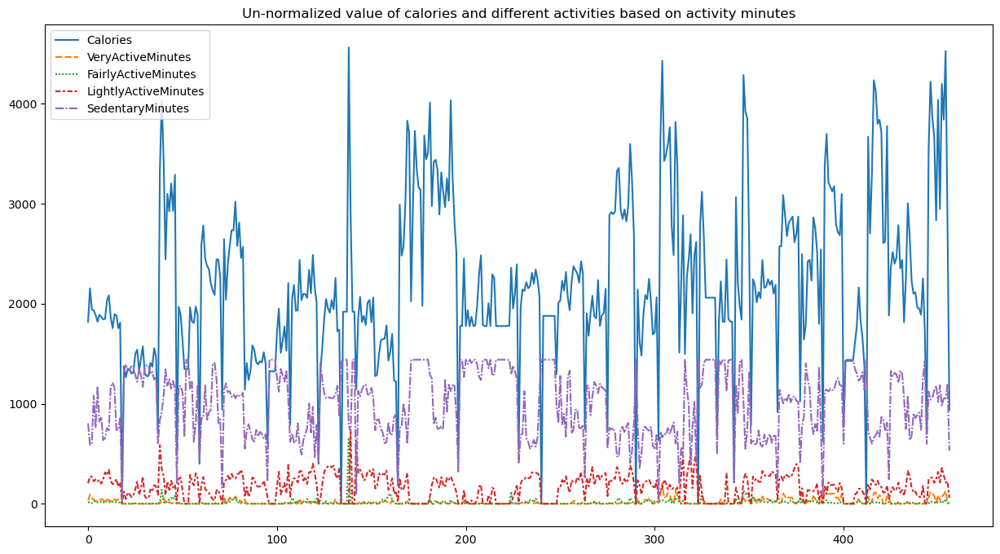

In [24]:
## plot the raw values 

col_select = ['Calories','VeryActiveMinutes','FairlyActiveMinutes','LightlyActiveMinutes','SedentaryMinutes']
wide_df = activity1[col_select]

# figure size
plt.figure(figsize=(15,8))

# timeseries plot using lineplot
ax = sns.lineplot(data=wide_df)

ax.set_title('Un-normalized value of calories and different activities based on activity minutes')

## KNN Model Classifier

In [25]:
activitydf=activitydf.drop(['ActivityDate'],axis=1) 

In [50]:
def splitting_train_test(dataframe):
    x_train,x_test,y_train,y_test=train_test_split(activitydf,activitydf['Id'],test_size=0.30, random_state=8)
    return x_train,x_test,y_train,y_test

In [51]:
x_train,x_test,y_train,y_test=splitting_train_test(activitydf)
x_test

,Id,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories
27,1624580081,1556,1.01,1.01,0.00000,0.00,0.00,1.01,0.01,0,0,88,1352,1327
78,2022484408,18247,13.83,13.83,0.00000,7.11,2.21,4.51,0.00,72,62,252,1054,3021
370,7007744171,12084,9.14,8.08,4.83638,4.39,0.46,4.29,0.00,50,6,284,1030,2676
131,2873212765,14103,9.56,9.56,0.00000,3.02,0.41,6.14,0.01,46,8,288,1098,2257
272,4558609924,5512,3.64,3.64,0.00000,0.00,0.00,3.64,0.00,0,0,276,1164,1882
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
386,7086361926,7338,4.67,4.67,0.00000,1.08,0.13,3.46,0.00,27,5,204,717,2519
397,8053475328,11159,9.14,9.14,0.00000,6.69,0.25,2.19,0.00,59,6,120,1255,2715
79,2022484408,13023,9.26,9.26,0.00000,3.23,0.56,5.47,0.00,40,12,296,1092,2577
24,1624580081,1675,1.09,1.09,0.00000,0.00,0.00,1.09,0.00,0,0,84,1356,1313


In [52]:
def predict_metrics(model,x_test,y_test):
    # predicting the class of test set
    y_pred=model.predict(x_test)
    # Transforming labels back to original encoding
    #calculating accuracy
    acc=accuracy_score(y_test, y_pred)
    #calculating precision score
    pre=precision_score(y_test, y_pred, average='macro')
    #calculating recall score
    rec=recall_score(y_test, y_pred, average='macro')
    #calculating f1 score
    f1=f1_score(y_test, y_pred, average='macro')
    print("Accuracy: ", accuracy_score(y_test, y_pred))
    print("Precision: ", precision_score(y_test, y_pred, average='macro'))
    print("Recall: ", recall_score(y_test, y_pred, average='macro'))
    print("F1 Score: ", f1_score(y_test, y_pred, average='macro'))
    return acc,pre,rec,f1

In [53]:
from sklearn.neighbors import KNeighborsClassifier
# creating k nearest neighbors model
knn = KNeighborsClassifier()
#fitting the model
knn.fit(x_train,y_train)

KNeighborsClassifier()

In [54]:
#from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
#knn_acc,knn_pre,knn_rec,knn_f1=predict_metrics(knn,x_test,y_test)

In [55]:
method_names = []
method_scores = []

Score for Number of Neighbors = 8: 0.9710144927536232


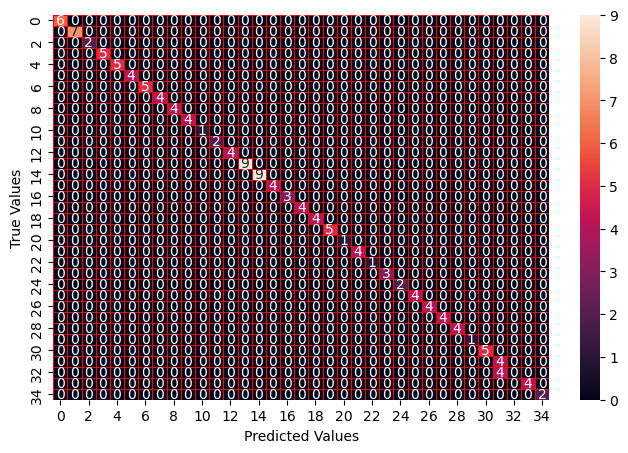

In [56]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix

knn = KNeighborsClassifier(n_neighbors=8)
knn.fit(x_train, y_train)
print("Score for Number of Neighbors = 8: {}".format(knn.score(x_test, y_test)))

method_names = []  # Define method_names list

method_names.append("KNN")
method_scores.append(knn.score(x_test, y_test))

y_pred = knn.predict(x_test)
conf_mat = confusion_matrix(y_test, y_pred)

f, ax = plt.subplots(figsize=(8, 5))
sns.heatmap(conf_mat, annot=True, linewidths=0.5, linecolor="red", fmt=".0f", ax=ax)
plt.xlabel("Predicted Values")
plt.ylabel("True Values")
plt.show()
